In [1]:
import os
import numpy as np
import mne
from mne.preprocessing import (ICA, create_eog_epochs, create_ecg_epochs, corrmap)
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn

In [2]:
%matplotlib qt

2024-10-11 09:27:38.900 Python[98360:3698806] ApplePersistenceIgnoreState: Existing state will not be touched. New state will be written to /var/folders/d0/p878jscj4m1f6w4d3xn26m1w0000gn/T/com.apple.python3.savedState


Channels marked as bad:
none


In [3]:
# high pass 
# low pass
# downsample
# channel exclusion
# re-referencing
# segment exclusion
# ica 
# interpolate bad channels
# epoching
# baseline correction

### Load EEG data

In [4]:
subject = '2024-09-19_eleonora'

In [5]:
vhdr_file = '/Users/majafriedemann/pilot_eeg_data/reward-effort-task/' + subject + '/p01_task1.vhdr'
raw = mne.io.read_raw_brainvision(vhdr_file, preload=True)
print(raw.info)

Extracting parameters from /Users/majafriedemann/pilot_eeg_data/reward-effort-task/2024-09-19_eleonora/p01_task1.vhdr...
Setting channel info structure...
Reading 0 ... 4333759  =      0.000 ...  4333.759 secs...
<Info | 7 non-empty values
 bads: []
 ch_names: Fp1, F3, F7, FC5, FC1, FCz, C3, T7, TP9, CP5, CP1, Pz, P3, P7, ...
 chs: 33 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 280.0 Hz
 meas_date: 2024-09-19 13:08:38 UTC
 nchan: 33
 projs: []
 sfreq: 1000.0 Hz
>


### Set montage

In [6]:
print(raw.ch_names)

['Fp1', 'F3', 'F7', 'FC5', 'FC1', 'FCz', 'C3', 'T7', 'TP9', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'O1', 'Oz', 'O2', 'P4', 'P8', 'TP10', 'CP6', 'CP2', 'CPz', 'Cz', 'C4', 'T8', 'FC6', 'FC2', 'F4', 'F8', 'Fp2', 'ECG', 'EOG']


In [7]:
mapping = {'ECG': 'ecg', 'EOG': 'eog'}
raw.set_channel_types(mapping)

<RawBrainVision | p01_task1.eeg, 33 x 4333760 (4333.8 s), ~1.07 GB, data loaded>

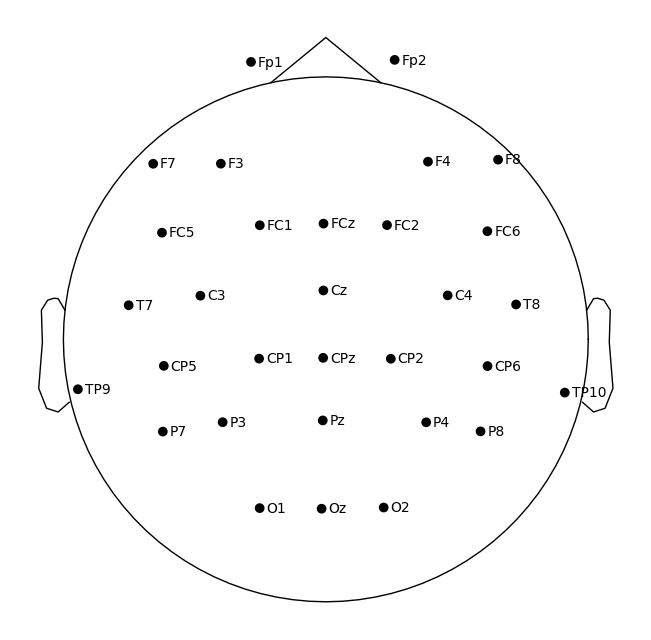

In [8]:
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)
raw.plot_sensors(kind='topomap', show_names=True)

### Filter

In [9]:
# Notch filter to remove power line noise
raw = raw.notch_filter(freqs=50)

# High-pass filter to remove slow drifts
raw = raw.filter(l_freq=.1, h_freq=None)

# Low-pass filter to remove high-frequency noise
raw = raw.filter(l_freq=None, h_freq=50)


Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 6601 samples (6.601 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.1s


Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 33001 samples (33.001 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.2s


Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 265 samples (0.265 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.1s


### Downsample

In [10]:
raw = raw.resample(250)

### Exclude bad channels

Using matplotlib as 2D backend.


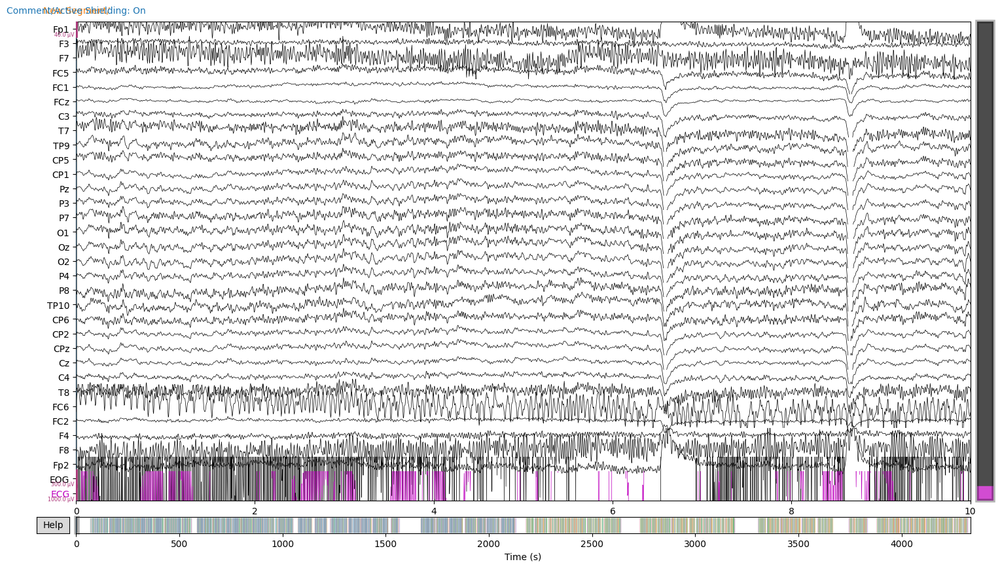

In [11]:
# plot raw data to check for noisy channels
raw.plot(n_channels=33, highpass=None, lowpass=None)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).


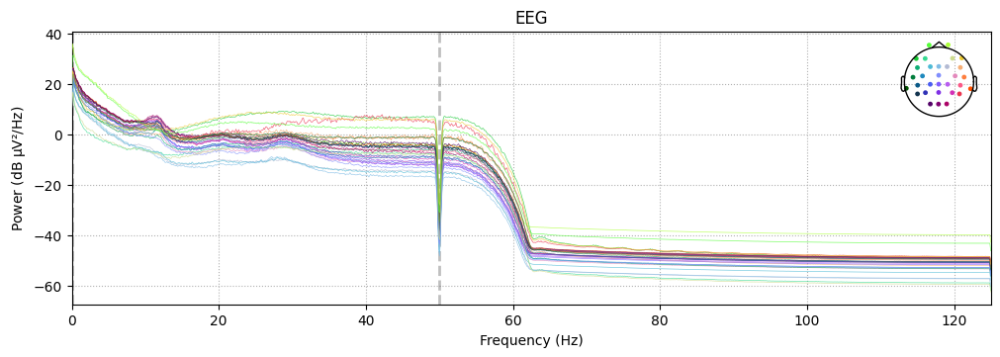

In [12]:
# plot power spectral density to check for noisy channels
raw.plot_psd(reject_by_annotation=False)

In [15]:
%matplotlib inline

<Axes: >

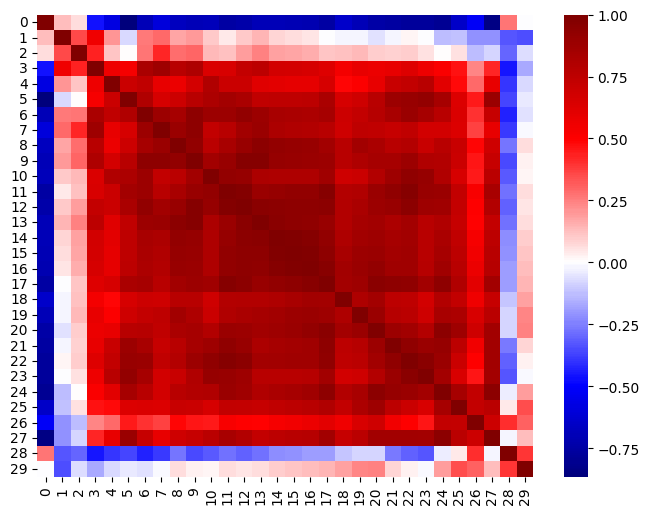

In [16]:
# plot channel correlation matrix to check for noisy channels
X = raw._data[:30]
cor = np.corrcoef(X)
plt.figure(figsize=(8,6))
sns.heatmap(cor, cmap='seismic', center=0)

<Axes: >

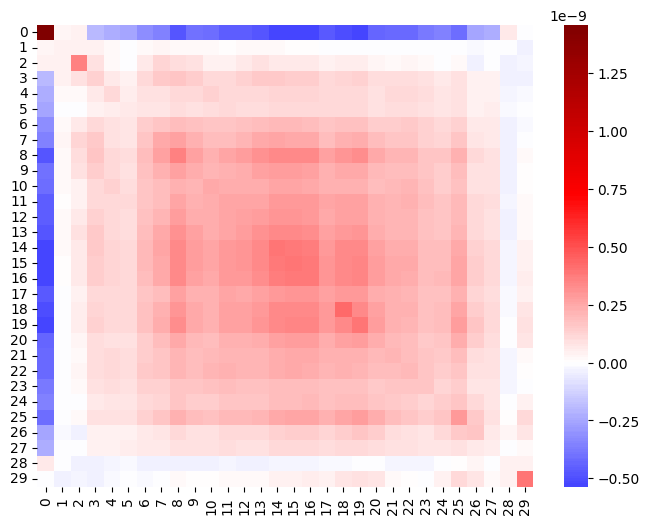

In [17]:
# plot channel covariance matrix to check for noisy channels
X = raw._data[:30]
cov = np.cov(X)
plt.figure(figsize=(8,6))
sns.heatmap(cov, cmap='seismic', center=0)

In [18]:
# use this to figure out which number refers to which channel 
print(raw.ch_names[0])

Fp1


In [19]:
# add entries here for channels to exclude (will be interpolated later on)
participant_bad_channels = {
    '2024-09-19_eleonora': ['Fp1']
}

# mark channel as bad
if subject in participant_bad_channels.keys():
    bads = participant_bad_channels[subject]
    raw.info['bads'] = bads


### Re-reference to mastoids

In [20]:
raw.set_eeg_reference(ref_channels=['TP9', 'TP10'])

EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.


<RawBrainVision | p01_task1.eeg, 33 x 1083440 (4333.8 s), ~272.8 MB, data loaded>

### Exclude bad segments

In [21]:
# check if any annotations have been saved for this participant
annot_file = '/Users/majafriedemann/pilot_eeg_data/reward-effort-task/' + subject + '/p01_task1-annotations.fif'

if os.path.exists(annot_file):
    txt = 'Annotations file found at %s.\nDo you want to load it?\ny/n...'
    resp = input(txt)
    if resp.lower() == 'y':
        old_annotations = mne.read_annotations(annot_file)
        raw = raw.set_annotations(old_annotations)
else:
    print('No annotations file found for this participant.')

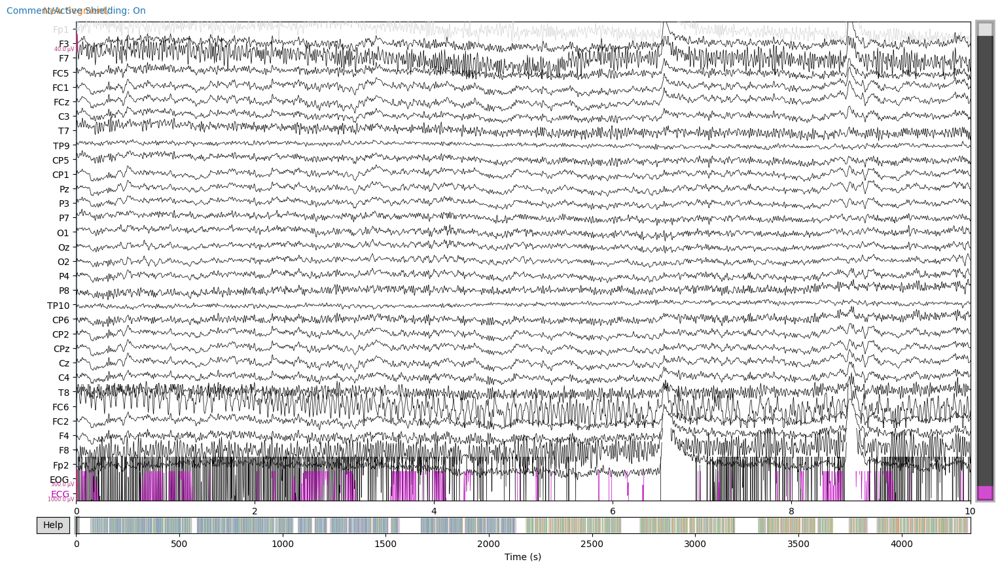

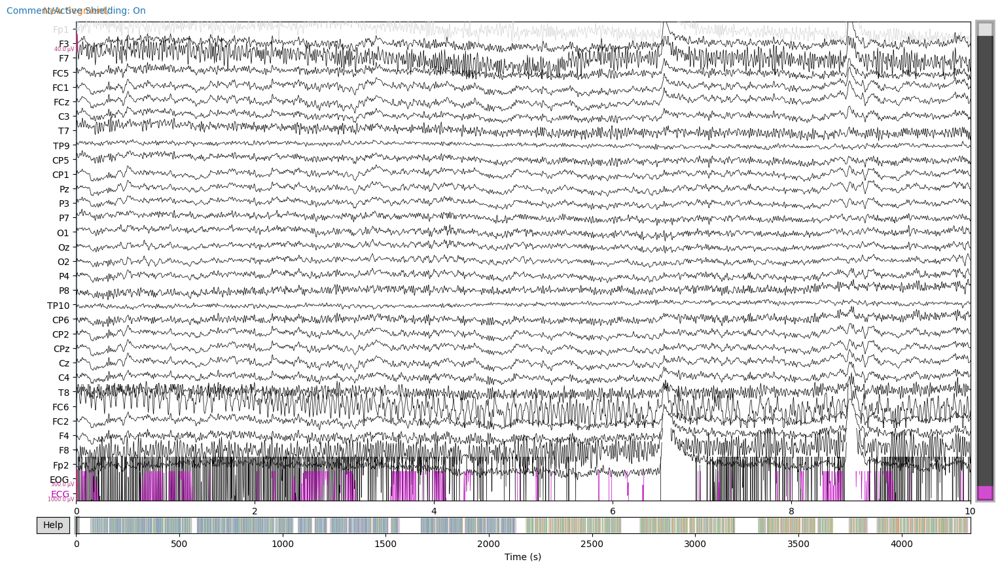

In [22]:
# plot raw data and manually select bad segments
raw.plot(n_channels=33, highpass=None, lowpass=None)

In [23]:
# save annotations in annotations file for participant 
if raw.annotations is not None:
    txt = 'Save annotations to file?\ny/n...'
    resp = input(txt)
    if resp.lower() == 'y':
        raw.annotations.save(annot_file, overwrite=True)

Overwriting existing file.


/var/folders/d0/p878jscj4m1f6w4d3xn26m1w0000gn/T/ipykernel_98360/2969033560.py:6: RuntimeWarning: This filename (/Users/majafriedemann/pilot_eeg_data/reward-effort-task/2024-09-19_eleonora/p01_task1-annotations.fif) does not conform to MNE naming conventions. All annotations files should end with -annot.fif, -annot.fif.gz, _annot.fif, _annot.fif.gz, .txt or .csv
  raw.annotations.save(annot_file, overwrite=True)


### ICA to remove eye movement artifacts

In [24]:
filt_raw = raw.copy()
filt_raw.load_data().filter(l_freq=1., h_freq=None)

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 825 samples (3.300 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


<RawBrainVision | p01_task1.eeg, 33 x 1083440 (4333.8 s), ~272.8 MB, data loaded>

In [25]:
ica = ICA(method='fastica', max_iter='auto', random_state=97)
ica.fit(filt_raw)

Fitting ICA to data using 30 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 29 components
Fitting ICA took 25.8s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,38 iterations on raw data (1083440 samples)
ICA components,29
Available PCA components,30
Channel types,eeg
ICA components marked for exclusion,—


Creating RawArray with float64 data, n_channels=31, n_times=1083440
    Range : 0 ... 1083439 =      0.000 ...  4333.756 secs
Ready.


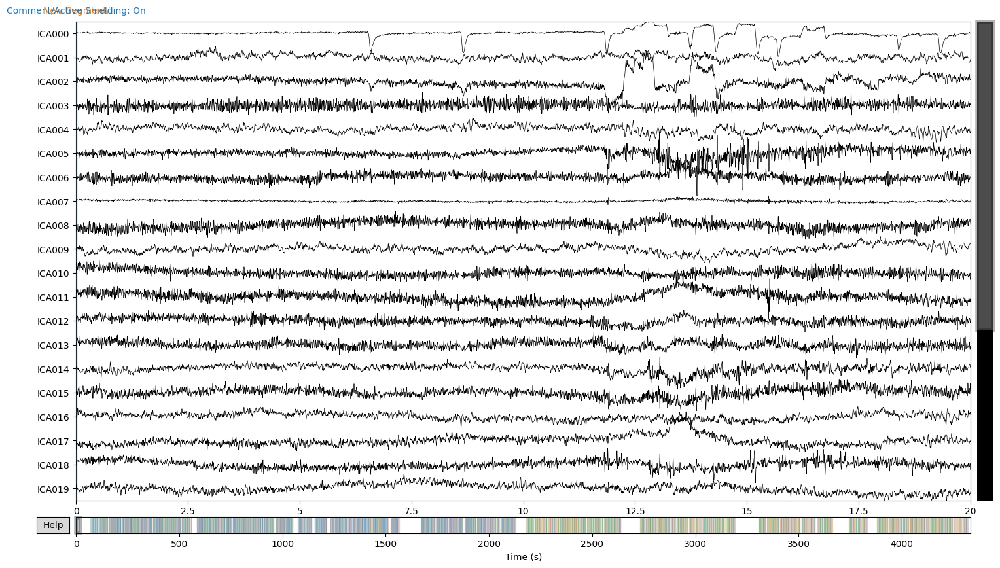

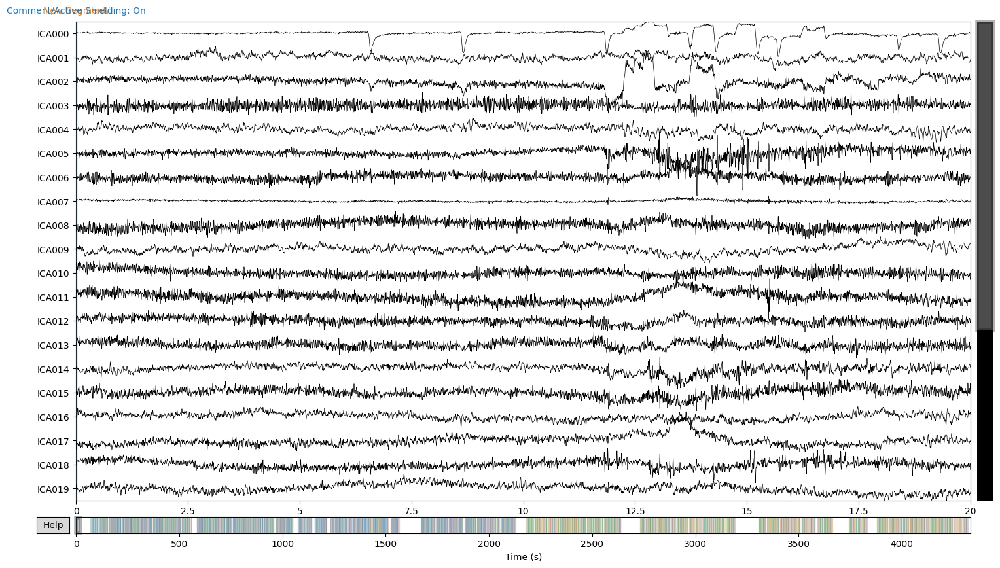

In [26]:
ica.plot_sources(raw)

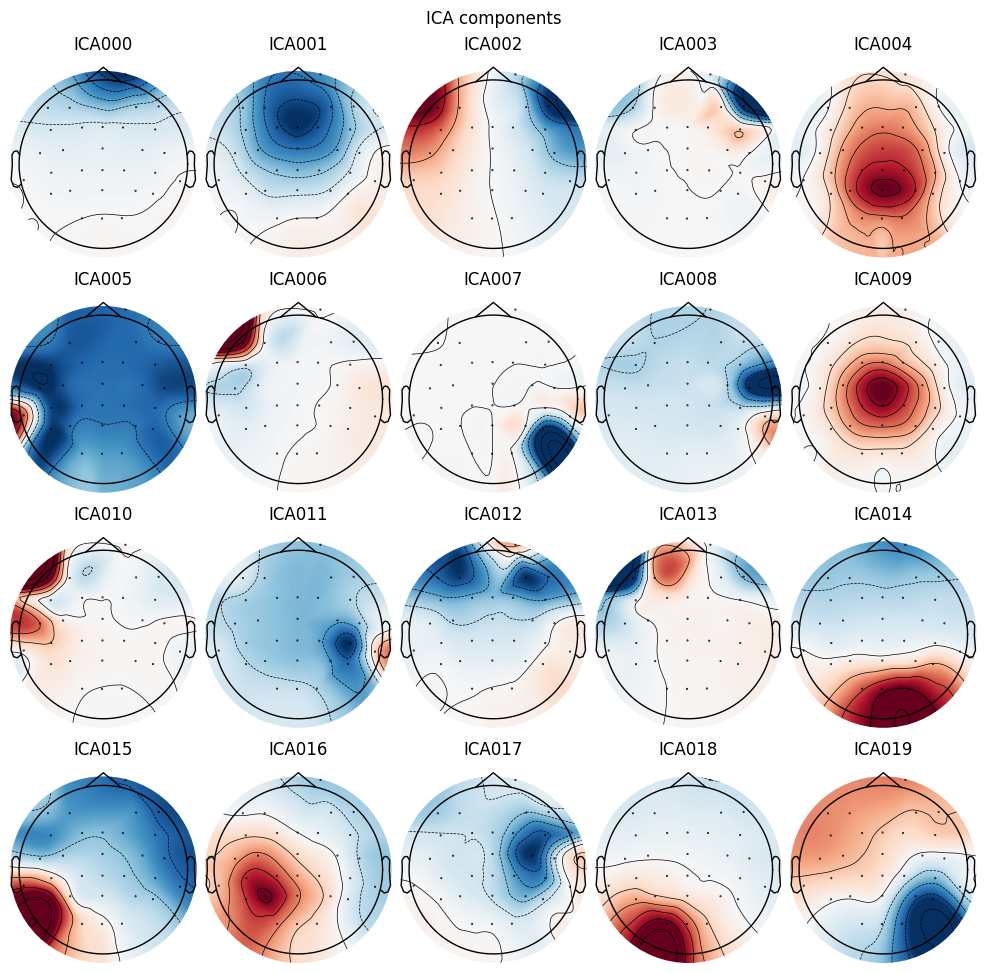

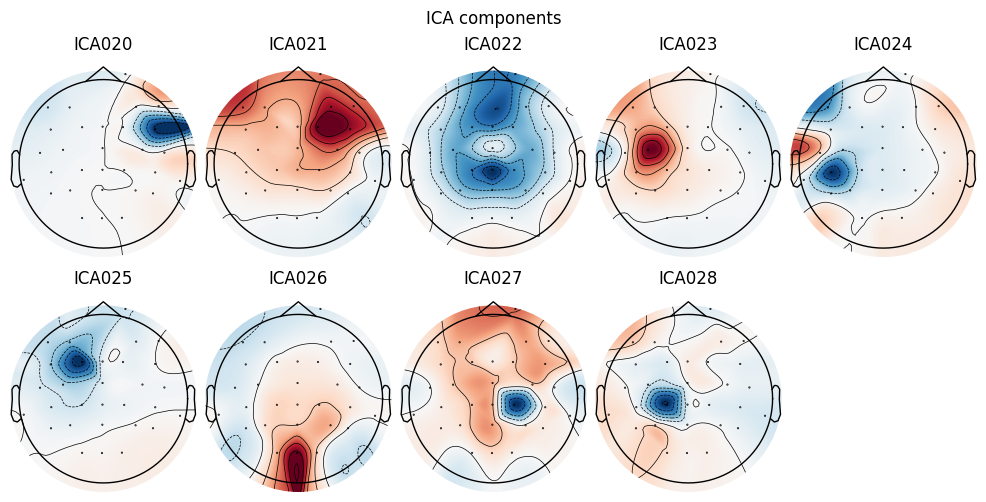

[<MNEFigure size 975x967 with 20 Axes>, <MNEFigure size 975x496 with 9 Axes>]

In [27]:
ica.plot_components()

In [28]:
# pick components to exclude
exclude_list = [0, 2, 3, 6]

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
2166 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
2166 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
2166 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
2166 matching events found
No baseline correction applied
0 projection items activated


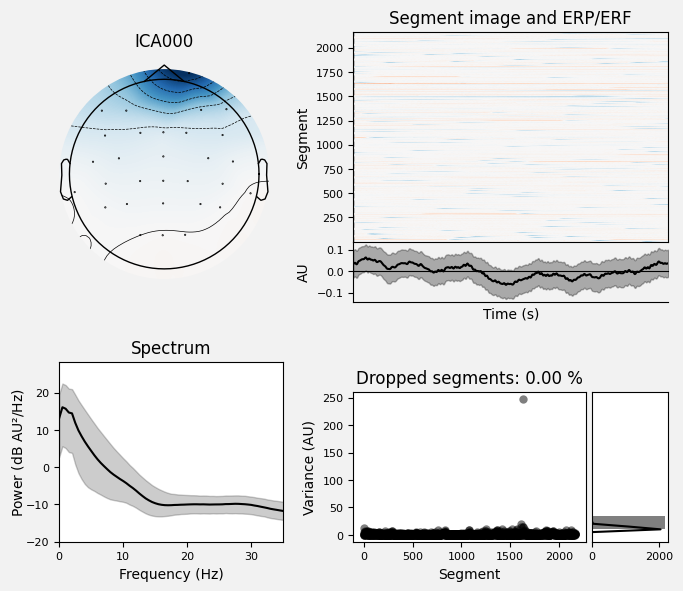

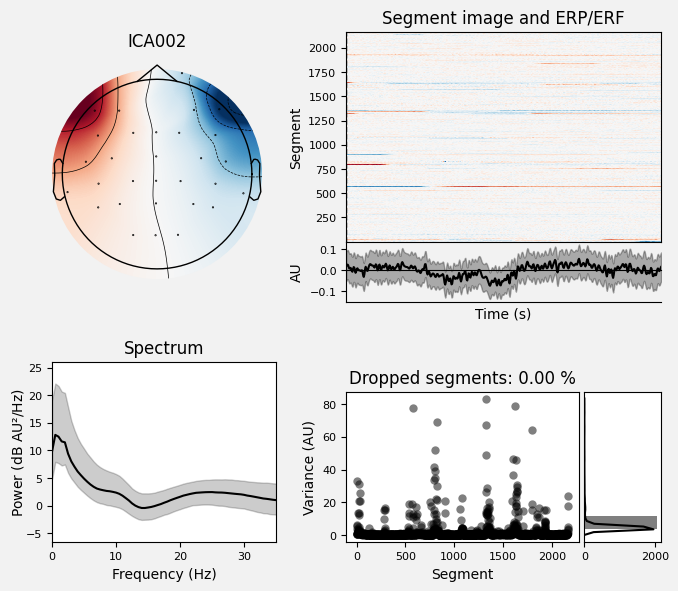

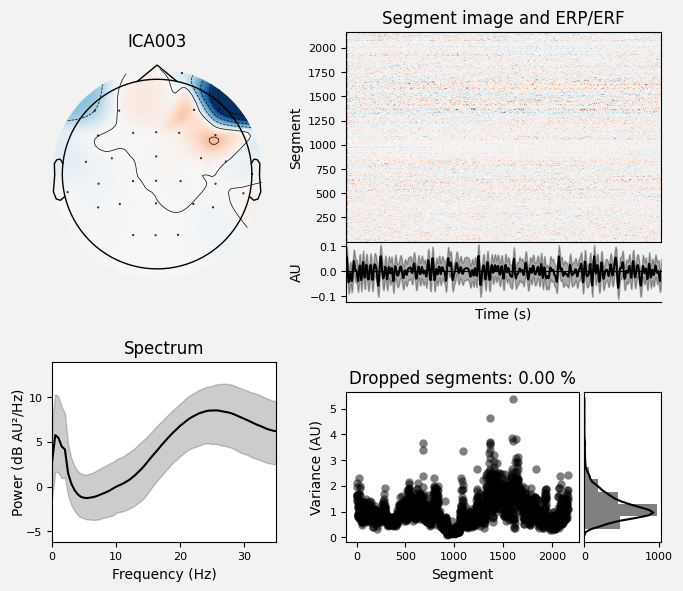

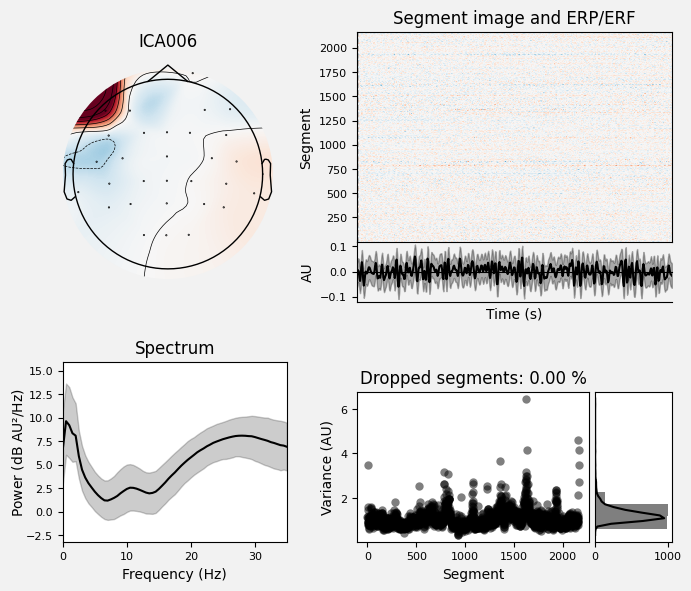

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [29]:
# inspect more closely before excluding
ica.plot_properties(raw, picks=exclude_list, psd_args={'fmax': 35.})

Applying ICA to Raw instance
    Transforming to ICA space (29 components)
    Zeroing out 4 ICA components
    Projecting back using 30 PCA components


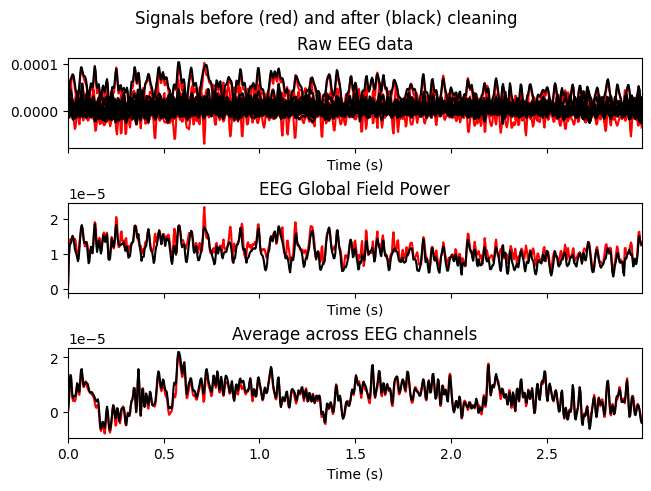

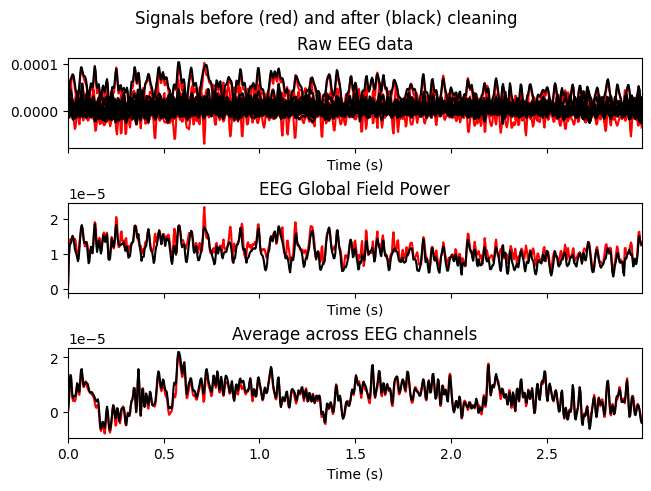

In [30]:
# plot an overlay of the original signal against the reconstructed signal with the artifactual ICs excluded
ica.plot_overlay(raw, exclude=exclude_list, picks='eeg')

In [31]:
# enter components to exclude (most likely the ones in exclude_list)
ica_excludes = {
    '2024-09-19_eleonora': [0, 2, 3, 6]
}

In [32]:
ica.exclude = ica_excludes['%s' % subject]

In [33]:
raw = ica.apply(raw)

Applying ICA to Raw instance
    Transforming to ICA space (29 components)
    Zeroing out 4 ICA components
    Projecting back using 30 PCA components


### Interpolate bad channels

In [34]:
raw = raw.interpolate_bads()

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 96.0 mm
Computing interpolation matrix from 30 sensor positions
Interpolating 1 sensors


### Save cleaned EEG data

In [35]:
cleaned_file = '/Users/majafriedemann/pilot_eeg_data/reward-effort-task/' + subject + '/p01_task1-cleaned.fif'
raw.save(cleaned_file, overwrite=True)

Overwriting existing file.
Writing /Users/majafriedemann/pilot_eeg_data/reward-effort-task/2024-09-19_eleonora/p01_task1-cleaned.fif


/var/folders/d0/p878jscj4m1f6w4d3xn26m1w0000gn/T/ipykernel_98360/1500160759.py:2: RuntimeWarning: This filename (/Users/majafriedemann/pilot_eeg_data/reward-effort-task/2024-09-19_eleonora/p01_task1-cleaned.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(cleaned_file, overwrite=True)


Closing /Users/majafriedemann/pilot_eeg_data/reward-effort-task/2024-09-19_eleonora/p01_task1-cleaned.fif
[done]


### Inspect some ERPs

In [36]:
events, old_event_dict = mne.events_from_annotations(raw)

stimulus_to_custom = {
    'Stimulus/S  1': 'experiment_start',
    'Stimulus/S  2': 'block_start',
    'Stimulus/S  3': 'effort_presentation_approach',
    'Stimulus/S  4': 'effort_presentation_avoid',
    'Stimulus/S  5': 'outcome_presentation_approach',
    'Stimulus/S  6': 'outcome_presentation_avoid',
    'Stimulus/S  7': 'participant_choice_accept',
    'Stimulus/S  8': 'participant_choice_reject',
    'Stimulus/S  9': 'rating_question_reward',
    'Stimulus/S 10': 'rating_question_heart',
    'Stimulus/S 11': 'rating_response_reward',
    'Stimulus/S 12': 'rating_response_heart',
    'Stimulus/S 13': 'effort_started',
    'Stimulus/S 14': 'effort_threshold_crossed',
    'Stimulus/S 15': 'effort_success',
    'Stimulus/S 16': 'outcome_presentation_approach_success',
    'Stimulus/S 17': 'outcome_presentation_approach_failure',
    'Stimulus/S 18': 'outcome_presentation_approach_reject',
    'Stimulus/S 19': 'outcome_presentation_avoid_success',
    'Stimulus/S 20': 'outcome_presentation_avoid_failure',
    'Stimulus/S 21': 'outcome_presentation_avoid_reject',
    'Stimulus/S 22': 'experiment_end',
}

event_dict = {stimulus_to_custom[key]: value for key, value in old_event_dict.items() if key in stimulus_to_custom}



Used Annotations descriptions: ['Comment/Active Shielding: On', 'New Segment/', 'Stimulus/S  1', 'Stimulus/S  2', 'Stimulus/S  3', 'Stimulus/S  4', 'Stimulus/S  5', 'Stimulus/S  6', 'Stimulus/S  7', 'Stimulus/S  8', 'Stimulus/S  9', 'Stimulus/S 10', 'Stimulus/S 11', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 16', 'Stimulus/S 18', 'Stimulus/S 19', 'Stimulus/S 21', 'Stimulus/S 22']


/var/folders/d0/p878jscj4m1f6w4d3xn26m1w0000gn/T/ipykernel_98360/3817365610.py:2: RuntimeWarning: event 10001 missing from event_id will be ignored
  fig = mne.viz.plot_events(events, event_id=event_dict, sfreq=raw.info['sfreq'],
/var/folders/d0/p878jscj4m1f6w4d3xn26m1w0000gn/T/ipykernel_98360/3817365610.py:2: RuntimeWarning: event 99999 missing from event_id will be ignored
  fig = mne.viz.plot_events(events, event_id=event_dict, sfreq=raw.info['sfreq'],
/var/folders/d0/p878jscj4m1f6w4d3xn26m1w0000gn/T/ipykernel_98360/3817365610.py:2: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  fig = mne.viz.plot_events(events, event_id=event_dict, sfreq=raw.info['sfreq'],


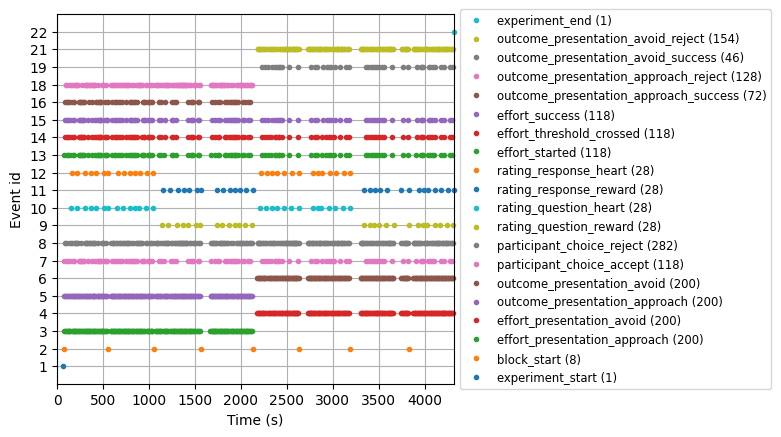

In [37]:
# show events timecourse
fig = mne.viz.plot_events(events, event_id=event_dict, sfreq=raw.info['sfreq'],
                          first_samp=raw.first_samp)

In [38]:
epochs = mne.Epochs(raw, events, event_id=event_dict, tmin=-0.2, tmax=0.5, preload=True)

Not setting metadata
2076 matching events found
Setting baseline interval to [-0.2, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 2076 events and 176 original time points ...
0 bad epochs dropped


##### P300

Not setting metadata
400 matching events found
No baseline correction applied
0 projection items activated


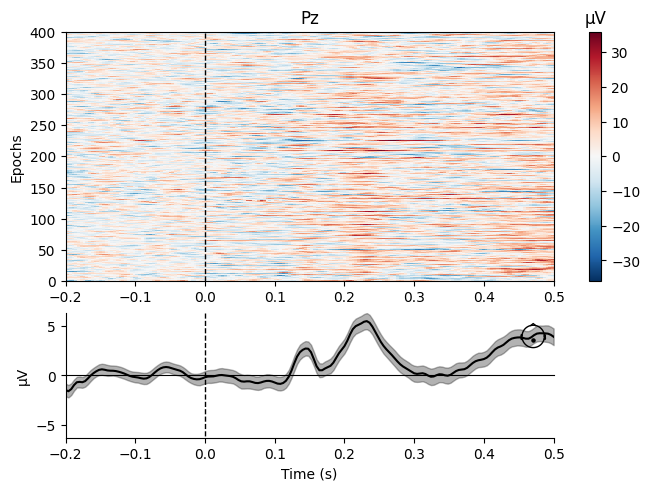

[<Figure size 640x480 with 4 Axes>]

In [39]:
outcome_presentation_epochs = epochs['outcome_presentation_approach', 'outcome_presentation_avoid']
outcome_presentation_epochs.plot_image(picks=['Pz'])

Not setting metadata
400 matching events found
No baseline correction applied
0 projection items activated


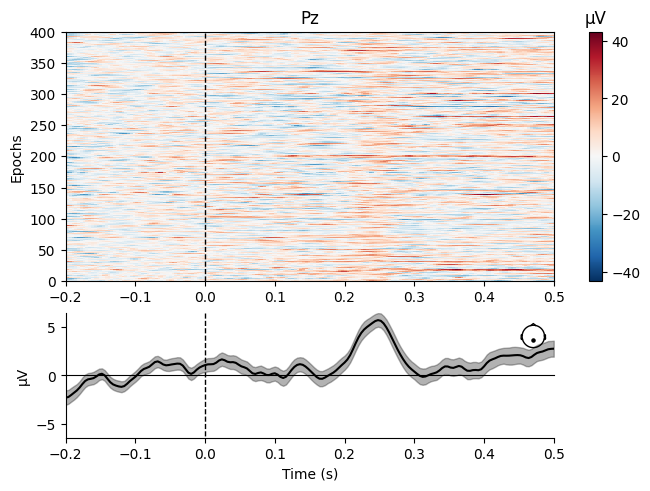

[<Figure size 640x480 with 4 Axes>]

In [40]:
effort_presentation_epochs = epochs['effort_presentation_approach', 'effort_presentation_avoid']
effort_presentation_epochs.plot_image(picks=['Pz'])

Not setting metadata
118 matching events found
No baseline correction applied
0 projection items activated


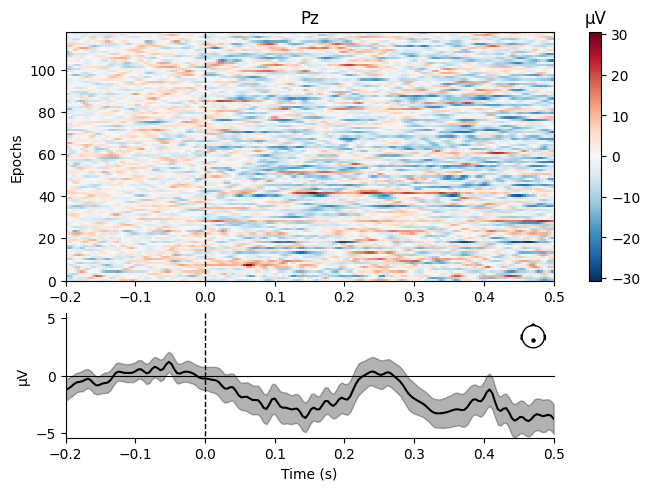

[<Figure size 640x480 with 4 Axes>]

In [41]:
outcome_success_presentation_epochs = epochs['outcome_presentation_approach_success', 'outcome_presentation_avoid_success']
outcome_success_presentation_epochs.plot_image(picks=['Pz'])

##### Visual P100

Not setting metadata
400 matching events found
No baseline correction applied
0 projection items activated


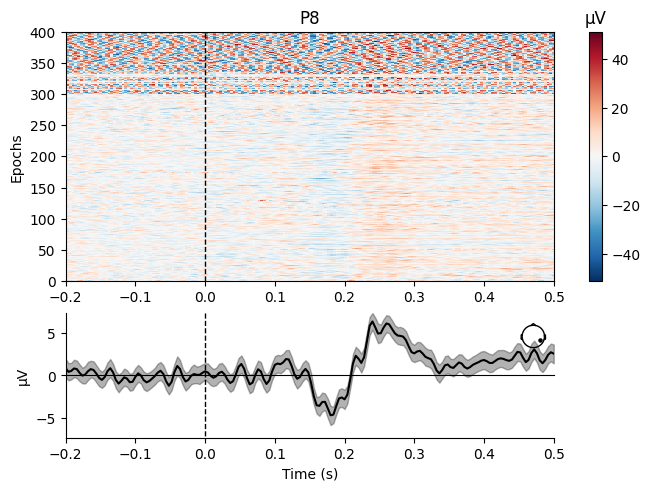

[<Figure size 640x480 with 4 Axes>]

In [42]:
outcome_presentation_epochs.plot_image(picks=['P8'])

Not setting metadata
400 matching events found
No baseline correction applied
0 projection items activated


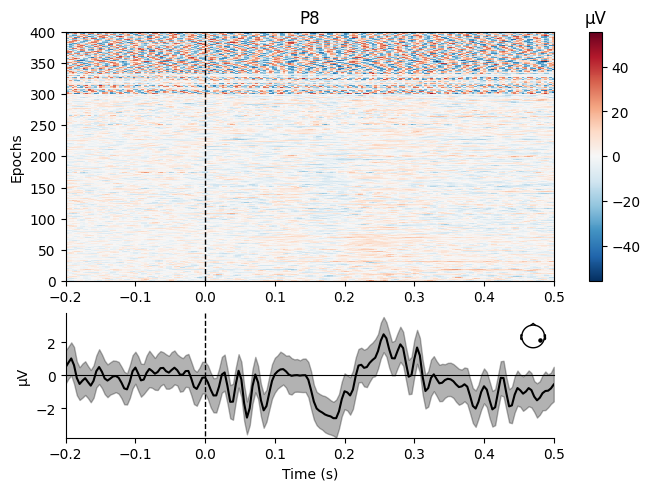

[<Figure size 640x480 with 4 Axes>]

In [43]:
effort_presentation_epochs.plot_image(picks=['P8'])

Not setting metadata
118 matching events found
No baseline correction applied
0 projection items activated


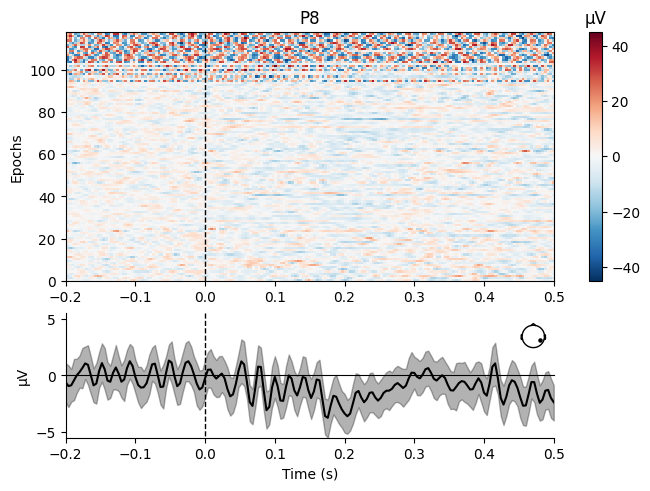

[<Figure size 640x480 with 4 Axes>]

In [44]:
outcome_success_presentation_epochs.plot_image(picks=['P8'])

##### Fronotcentral N100

Not setting metadata
400 matching events found
No baseline correction applied
0 projection items activated


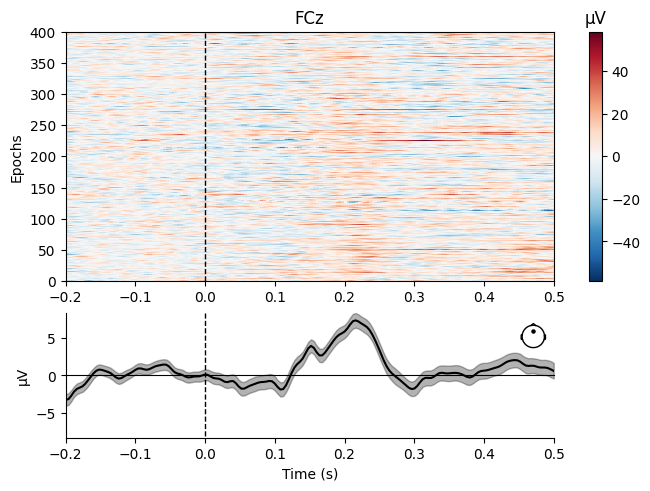

[<Figure size 640x480 with 4 Axes>]

In [45]:
outcome_presentation_epochs.plot_image(picks=['FCz'])

Not setting metadata
400 matching events found
No baseline correction applied
0 projection items activated


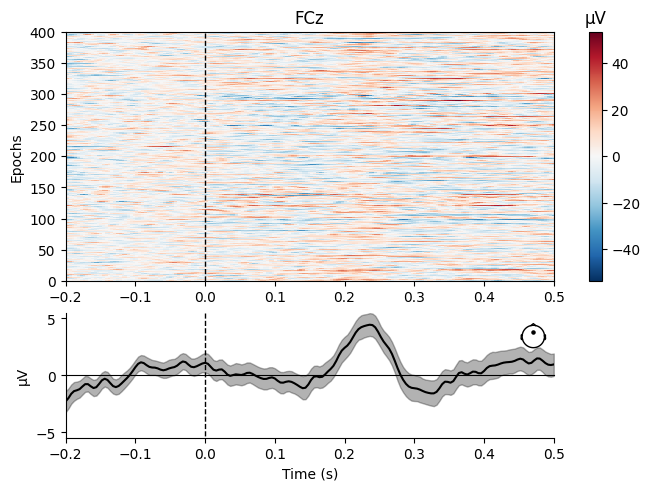

[<Figure size 640x480 with 4 Axes>]

In [46]:
effort_presentation_epochs.plot_image(picks=['FCz'])

Not setting metadata
118 matching events found
No baseline correction applied
0 projection items activated


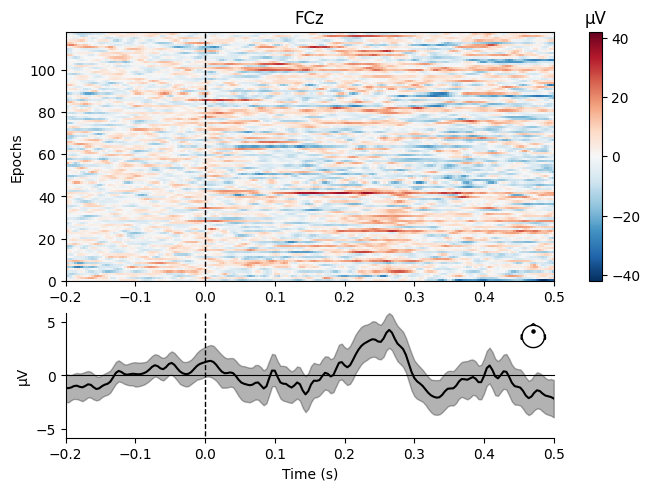

[<Figure size 640x480 with 4 Axes>]

: 

In [47]:
outcome_success_presentation_epochs.plot_image(picks=['FCz'])